In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn import preprocessing
from latentcor import get_tps, latentcor
%matplotlib inline

In [2]:
def normalize(X):
    """
    transforms to the simplex
    X should be of a pd.DataFrame of form (p,N)
    """
    return X / X.sum(axis=0)

In [3]:
def geometric_mean(x, positive=False):
    """
    calculates the geometric mean of a vector
    """
    assert not np.all(x == 0)

    if positive:
        x = x[x > 0]
    a = np.log(x)
    g = np.exp(a.sum() / len(a))
    return g

In [4]:
def log_transform(X, transformation=str, eps=0.1):
    """
    log transform, scaled with geometric mean
    X should be a pd.DataFrame of form (p,N)
    """
    if transformation == "clr":
        assert not np.any(X.values == 0), "Add pseudo count before using clr"
        g = X.apply(geometric_mean)
        Z = np.log(X / g)
    elif transformation == "mclr":
        g = X.apply(geometric_mean, positive=True)
        X_pos = X[X > 0]
        Z = np.log(X_pos / g)
        Z = Z + abs(np.nanmin(Z.values)) + eps
        Z = Z.fillna(0)
    return Z

In [5]:
def transform_features(X: pd.DataFrame, transformation: str = "clr", pseudo_count: int = 1) -> pd.DataFrame:
    """
    Project compositional data to Euclidean space.

    Parameters
    ----------
    pseudo_count: int, optional
        Add pseudo count, only necessary for transformation = "clr".
    table: biom.Table
        A table with count microbiome data.
    transformation: str
        If 'clr' the data is transformed with center log-ratio method by Aitchison (1982).
        If 'mclr' the data is transformed with modified center log-ratio method by Yoon et al. (2019).

    Returns
    -------
    X: pd.Dataframe
        Count data projected to Euclidean space.

    """
    columns = X.columns

    if transformation == "clr":
        X = zero_imputation(X, pseudo_count=pseudo_count)
        X = normalize(X)
        X = log_transform(X, transformation=transformation)

        return pd.DataFrame(X, columns=columns)

    elif transformation == "mclr":
        X = normalize(X)
        X = log_transform(X, transformation=transformation)

        return pd.DataFrame(X, columns=columns)

    else:
        raise ValueError(
            "Unknown transformation name, use clr and not %r" % transformation
        )

In [6]:
def corr_heatmap(corr_df, title=None, show_plot=False):
    """
    Visualize correlation matrix with heatmap.
    
    Parameters
    ----------
    corr_df: pd.Series
        Pandas dataframe representing correlation matrix (symmetric).
    title: str, optional
        Title of the plot.
    show_plot: bool, optional
        Show the plot as an output.

    Returns
    -------
    fig: plotly.go object
        Heatmap figure.
    
    """

    heat = go.Heatmap(
        z = corr_df,
        x = corr_df.columns.values,
        y = corr_df.columns.values,
        zmin = - 1, # Sets the lower bound of the color domain
        zmax = 1,
        xgap = 1, # Sets the horizontal gap (in pixels) between bricks
        ygap = 1,
        colorscale = 'RdBu_r'
    )

    layout = go.Layout(
        title_text=title, 
        title_x=0.5, 
        width=2400, 
        height=2400,
        xaxis_showgrid=False,
        yaxis_showgrid=False,
        yaxis_autorange='reversed'
    )

    fig=go.Figure(data=[heat], layout=layout)
    if show_plot:
        fig.show()
    
    return fig

# Atacama soil microbiome

## Import count data

Original data has been published by [Christian L Lauber](https://pubmed.ncbi.nlm.nih.gov/19502440/).

We have preprocessed the data with [Qiime2](https://github.com/Vlasovets/q2-gglasso/blob/master/example/atacama/atacama_example.ipynb) which resulted in having 53 samples and 130 ASVs.

In [8]:
acm_soil_counts = pd.read_csv('data/composition_feature-table.tsv', sep='\t', index_col = 0)
acm_soil_counts

,BAQ2420.1.1,BAQ2420.1.2,BAQ2420.1.3,BAQ2420.2,BAQ2420.3,BAQ2462.1,BAQ2462.2,BAQ2462.3,BAQ2687.1,BAQ2687.2,...,YUN3533.1.1,YUN3533.1.2,YUN3533.1.3,YUN3533.2,YUN3533.3,YUN3856.1.1,YUN3856.1.2,YUN3856.1.3,YUN3856.2,YUN3856.3
#OTU ID,,,,,,,,,,,,,,,,,,,,,
409faa5f5353e543bf6d99125c7c0e83,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,102.0,181.0,65.0,109.0,0.0,597.0,0.0,129.0,0.0
1237d5925a7176fced9dda961a86c684,0.0,0.0,9.0,92.0,0.0,86.0,57.0,0.0,0.0,0.0,...,0.0,0.0,76.0,958.0,97.0,0.0,0.0,0.0,0.0,0.0
a7b877ae6d2f079a15b6b192a4425620,0.0,0.0,0.0,40.0,50.0,46.0,24.0,69.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25.0,0.0,0.0
ef3fdbe1dcde754d91130cde6a4b4d61,0.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,44.0,0.0,83.0,0.0,0.0,0.0,80.0,0.0
96cbccca68ad868a78bb0604e4a41cf5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,39.0,34.0,77.0,55.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f31d6dfeec66b22ac98f0605d57e7bb4,0.0,0.0,0.0,49.0,36.0,19.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9c52587208449196032dd3b5417a0726,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
d77495f5ee973c882fee45fc5fbf77a5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,86.0


Microbial count data is zero-inflated.

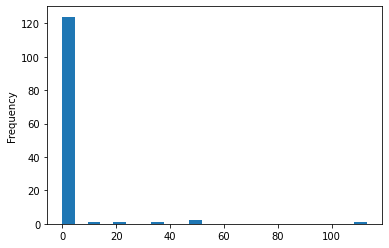

In [14]:
acm_soil_counts.iloc[:, 0].plot.hist(bins=24, alpha=1).get_figure().savefig('plots/org_count.png')

It is also compositional and we apply mclr-transformation to avoid unit-sum constraint in the sample vectors.

In [10]:
acm = transform_features(acm_soil_counts, transformation="mclr")

<ipython-input-4-f3d0c3d7d389>:13: RuntimeWarning: invalid value encountered in log
  Z = np.log(X_pos / g)


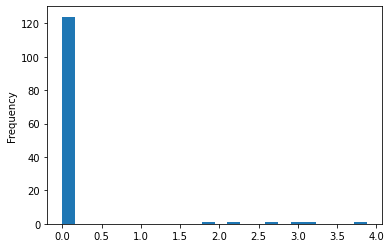

In [15]:
acm.iloc[:, 0].plot.hist(bins=24, alpha=1).get_figure().savefig('plots/mclr_count.png')

## Covariates

There are 15 numeric covariates associated with microbial count data.

In [16]:
# covariates
meta = pd.read_csv('data/acm_meta.tsv', sep='\t', index_col = 0)

meta = meta.loc[:, meta.iloc[0, :] != 'categorical'] # take numeric features
meta = meta.apply(pd.to_numeric, errors='coerce') # make sure every feature has a numeric type
meta = meta.dropna(how='all') # drop entire empty columns if any

# meta = meta.iloc[1:]
meta

,elevation,extract-concen,amplicon-concentration,depth,ph,toc,ec,average-soil-relative-humidity,relative-humidity-soil-high,relative-humidity-soil-low,percent-relative-humidity-soil-100,average-soil-temperature,temperature-soil-high,temperature-soil-low,percentcover
sample-id,,,,,,,,,,,,,,,
BAQ1370.1.2,1370.0,0.019,0.95,2.0,7.98,525.0,6.080,16.17,23.97,11.42,0.0,22.61,35.21,12.46,0.0
BAQ1370.3,1370.0,0.124,17.46,2.0,NaN,771.0,6.080,16.17,23.97,11.42,0.0,22.61,35.21,12.46,0.0
BAQ1370.1.3,1370.0,1.200,0.96,3.0,8.13,NaN,NaN,16.17,23.97,11.42,0.0,22.61,35.21,12.46,0.0
BAQ1552.1.1,1552.0,0.722,18.83,1.0,7.87,NaN,NaN,15.75,35.36,11.10,0.0,22.63,30.65,10.96,0.0
BAQ1552.2,1552.0,0.017,2.00,2.0,NaN,223.0,1.839,15.75,35.36,11.10,0.0,22.63,30.65,10.96,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YUN3856.1.1,3856.0,6.444,12.93,1.0,6.98,NaN,NaN,99.44,100.00,73.75,93.7,9.51,17.45,0.45,3.1
YUN3856.1.2,3856.0,6.230,16.35,2.0,7.43,713.0,0.029,99.44,100.00,73.75,93.7,9.51,17.45,0.45,3.1
YUN3856.2,3856.0,4.178,17.12,2.0,7.43,404.0,0.029,99.44,100.00,73.75,93.7,9.51,17.45,0.45,3.1


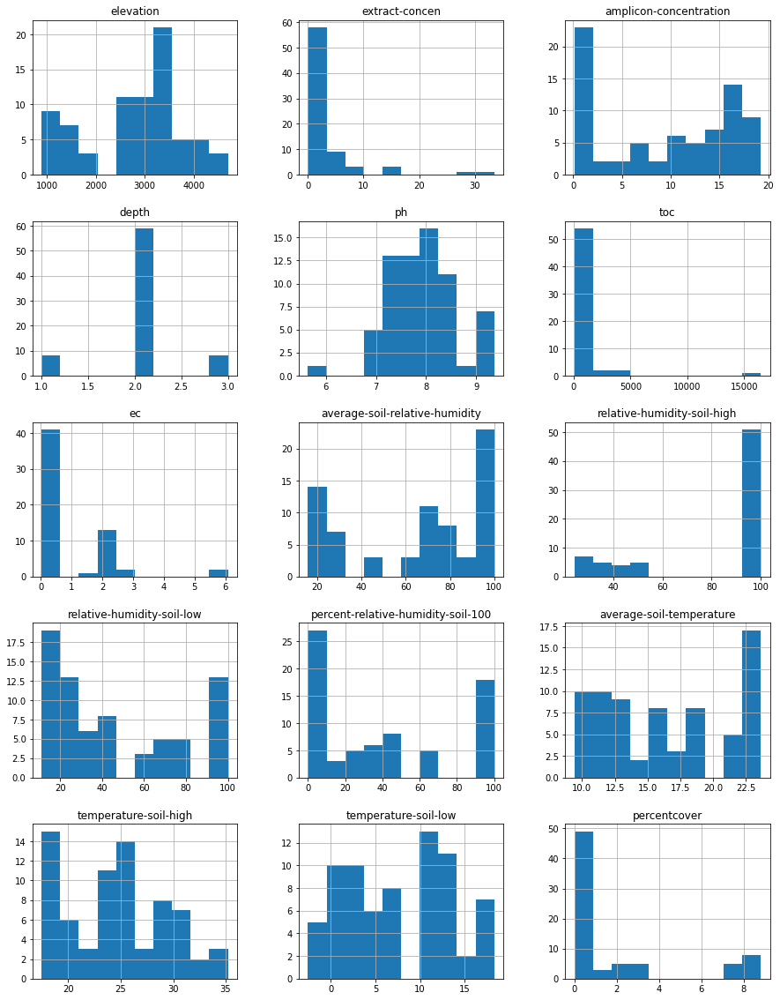

In [18]:
fig, axis = plt.subplots(5,3,figsize=(15, 20))
meta.hist(ax=axis)
fig.savefig('plots/meta_hist.png')

The covariates have different scale and we need to standartise with $mu=0$ and $\sigma=1$.

In [19]:
scaler = preprocessing.StandardScaler().fit(meta)
scaled = scaler.transform(meta)

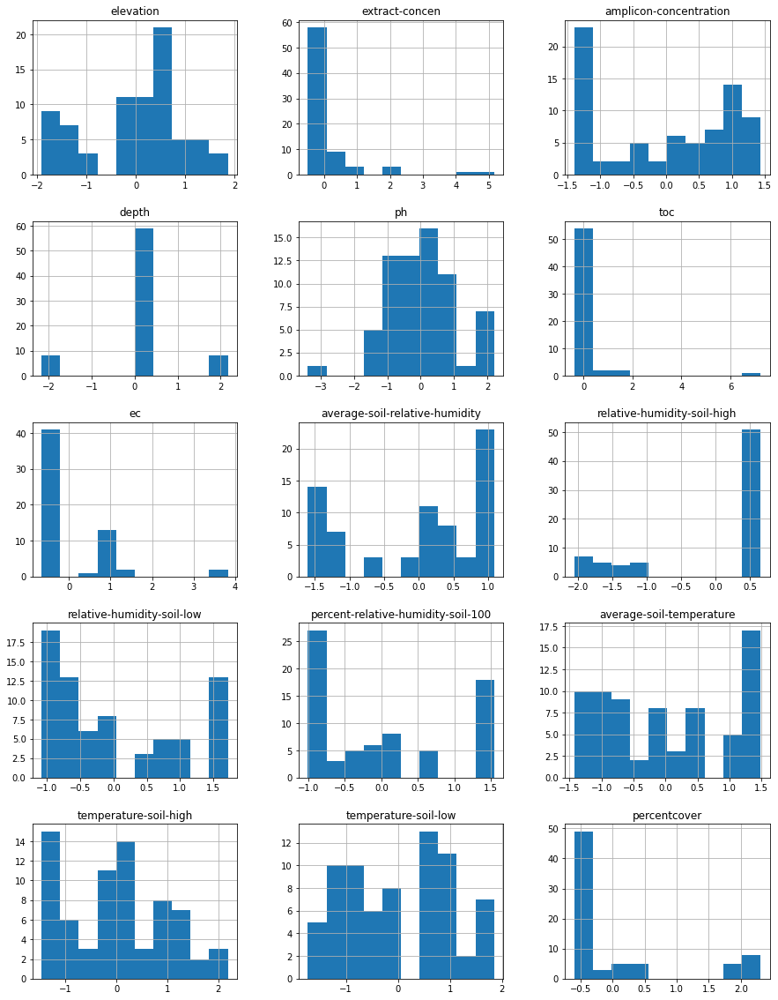

In [20]:
meta_scaled = pd.DataFrame(scaled, index=meta.index, columns=meta.columns)

fig, axis = plt.subplots(5,3,figsize=(15, 20))
meta_scaled.hist(ax=axis)

fig.savefig('plots/meta_hist_scaled.png')

## Merge counts and covariates

Now, we merge counts and covariates by sample ID.

In [21]:
# join by sample id
acm_T = acm.T 

df = acm_T.join(meta_scaled) # left join

df.isnull().sum().any() # check missing values

True

There are missing values which will prevent us calculating latent correlation, so impute them with zeros.

In [22]:
df = df.fillna(0)

df.isnull().sum().any() # check missing values

False

We also need to drop features with no variance if any to be able to calculate the correlation.

In [23]:
# drop covariates with zero variance
for var in df.columns:
    if df[var].var() == 0:
        print("'{0}' covariate has been dropped".format(var))
        del df[var]

In [24]:
# N, p
df.shape

(53, 145)

We rename ASVs features indices with shorter names for visualization purposes.

In [25]:
vis_df = df.copy()

In [26]:
# Rename long feature IDs with concise names
id_dict = dict()

i = 1
for col in vis_df.columns:
    # length of ASVs identifier
    if len(col) == 32:
        asv_name = "ASV_{0}".format(i)
        id_dict[asv_name] = col
        vis_df.rename(columns={col: asv_name}, inplace=True)
        
        i += 1
        
vis_df.head()

,ASV_1,ASV_2,ASV_3,ASV_4,ASV_5,ASV_6,ASV_7,ASV_8,ASV_9,ASV_10,...,toc,ec,average-soil-relative-humidity,relative-humidity-soil-high,relative-humidity-soil-low,percent-relative-humidity-soil-100,average-soil-temperature,temperature-soil-high,temperature-soil-low,percentcover
BAQ2420.1.1,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,3.879067,0.0,0.0,...,0.000000,0.000000,0.53068,0.647584,-0.135506,0.186894,1.244705,0.761471,0.983966,-0.602138
BAQ2420.1.2,0.0,0.000000,0.000000,2.668353,0.0,2.157528,0.0,0.000000,0.0,0.0,...,-0.332196,-0.623764,0.53068,0.647584,-0.135506,0.186894,1.244705,0.761471,0.983966,-0.602138
BAQ2420.1.3,0.0,1.250439,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.53068,0.647584,-0.135506,0.186894,1.244705,0.761471,0.983966,-0.602138
BAQ2420.2,0.0,3.858251,3.025342,0.000000,0.0,2.668667,0.0,0.000000,0.0,0.0,...,-0.252853,-0.623764,0.53068,0.647584,-0.135506,0.186894,1.244705,0.761471,0.983966,-0.602138
BAQ2420.3,0.0,0.000000,3.158820,0.000000,0.0,2.019386,0.0,3.007997,0.0,0.0,...,-0.142886,-0.623764,0.53068,0.647584,-0.135506,0.186894,1.244705,0.761471,0.983966,-0.602138


In [48]:
vis_df.to_csv("data/atacama_cooked.csv")

# Latent correlation with latentcorr

We automatically extract mixed types from the data using get_tps() method.

In [27]:
N, p = df.shape

clean_types = get_tps(vis_df)

ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by either countinuous or truncated type.
ordinal levels between 4 and 10 will be approximated by eith

The count table is supposed to be truncated type, but since we have few samples and the data is strongly zero-inflated some of the features considered to be binary or ternary. Covariates as expected mostly have continious type.

In [28]:
print(clean_types)

['tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'ter'
 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'bin' 'tru' 'tru' 'tru'
 'tru' 'bin' 'bin' 'bin' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru'
 'tru' 'bin' 'bin' 'tru' 'tru' 'tru' 'bin' 'tru' 'ter' 'tru' 'tru' 'ter'
 'tru' 'tru' 'tru' 'tru' 'bin' 'bin' 'ter' 'tru' 'tru' 'tru' 'bin' 'tru'
 'bin' 'ter' 'ter' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru' 'bin' 'tru' 'ter'
 'ter' 'tru' 'tru' 'tru' 'bin' 'bin' 'tru' 'tru' 'tru' 'tru' 'tru' 'tru'
 'bin' 'tru' 'tru' 'bin' 'bin' 'tru' 'tru' 'ter' 'tru' 'bin' 'ter' 'tru'
 'tru' 'tru' 'tru' 'tru' 'tru' 'bin' 'tru' 'tru' 'tru' 'ter' 'tru' 'bin'
 'tru' 'tru' 'ter' 'tru' 'tru' 'tru' 'ter' 'tru' 'tru' 'tru' 'ter' 'ter'
 'tru' 'tru' 'tru' 'bin' 'bin' 'tru' 'tru' 'ter' 'tru' 'ter' 'con' 'con'
 'con' 'ter' 'con' 'con' 'con' 'con' 'con' 'con' 'con' 'con' 'con' 'con'
 'con']


## Original method

In [29]:
### N, p input
org_lat_cor = latentcor(vis_df, tps=clean_types, method='original', use_nearPD=False)

In [30]:
R_org = org_lat_cor['R']

## Appoximate method

In [31]:
approx_pdTRUE = latentcor(vis_df, tps=clean_types, method='approx', use_nearPD=True, nu=0.001, tol=1e-4)

/Users/oleg.vlasovetc/opt/anaconda3/lib/python3.8/site-packages/statsmodels/stats/correlation_tools.py:90: IterationLimitWarning: 
Maximum iteration reached.

  warnings.warn(iteration_limit_doc, IterationLimitWarning)


In [32]:
R_pdTRUE = approx_pdTRUE['R']

In [33]:
approx_pdFALSE = latentcor(vis_df, tps=clean_types, method='approx', use_nearPD=False, nu=0.001, tol=1e-4)

In [34]:
R_pdFALSE = approx_pdFALSE["R"]

# Heatmaps

The latent correlation matrices are very unlike to Kendall correlation matrix.

In [35]:
kendall = vis_df.corr(method='kendall')

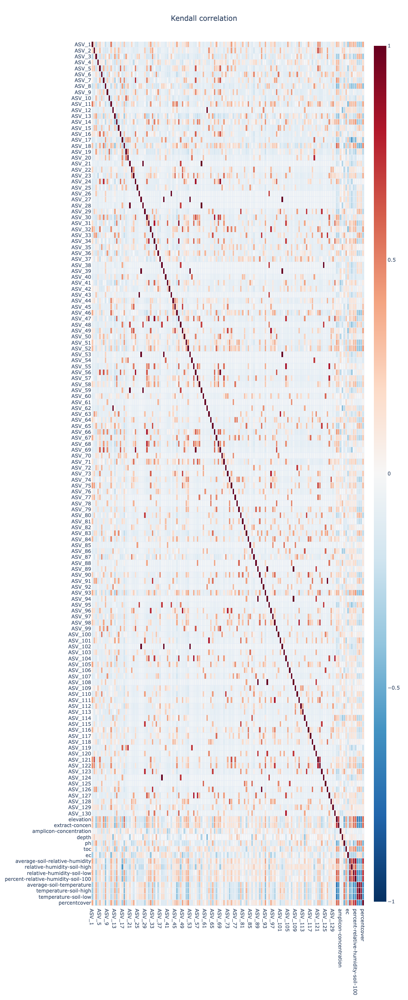

In [ ]:
kendall_fig = corr_heatmap(kendall,title="Kendall correlation", show_plot=True)
kendall_fig.write_image("plots/kendall.png")

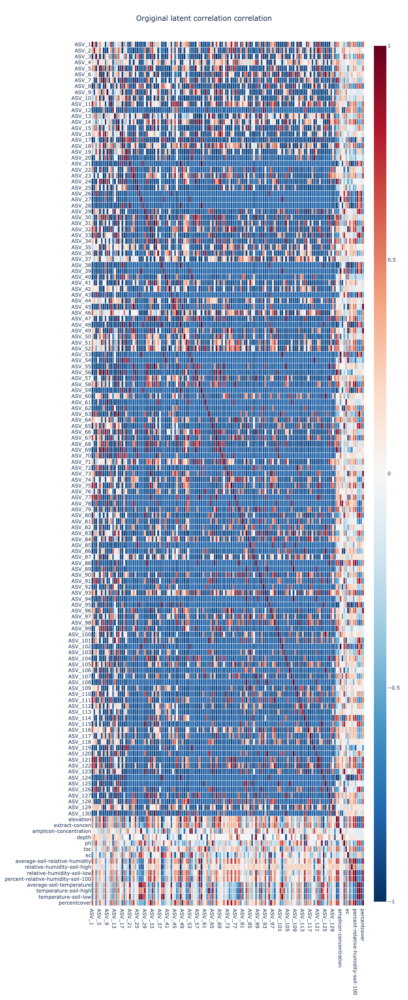

In [ ]:
R_org_fig = corr_heatmap(R_org, title="Orgiginal latent correlation correlation", show_plot=True)
R_org_fig.write_image("plots/orgiginal_latent_correlation.png")

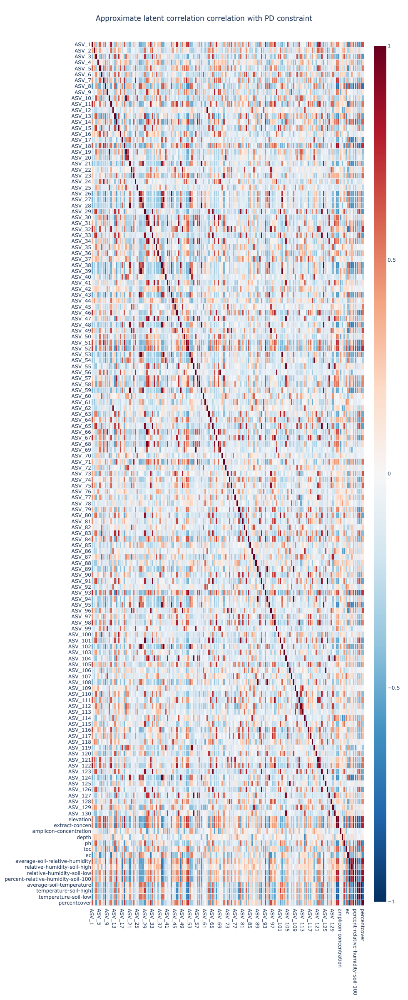

In [ ]:
R_pdTRUE_fig = corr_heatmap(R_pdTRUE, title="Approximate latent correlation correlation with PD constraint", show_plot=True)
R_pdTRUE_fig.write_image("plots/approx_latent_correlation_PD.png")

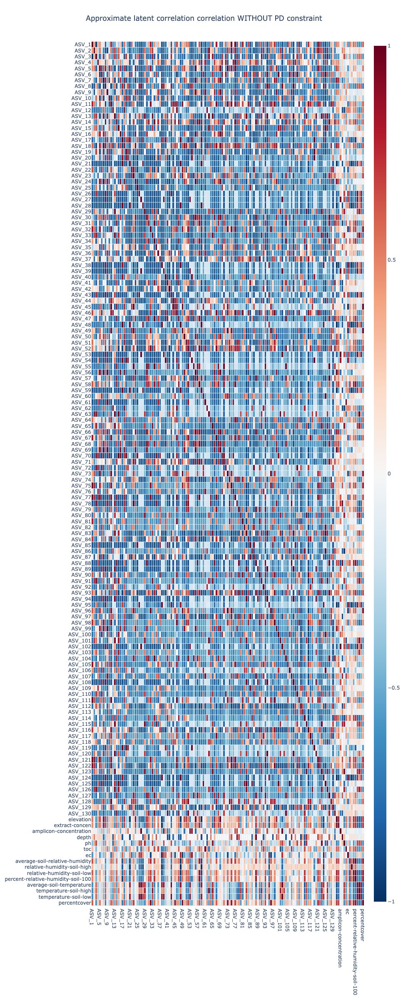

In [ ]:
R_pdFALSE_fig = corr_heatmap(R_pdFALSE, title="Approximate latent correlation correlation WITHOUT PD constraint", show_plot=True)
R_pdFALSE_fig.write_image("plots/approx_latent_correlation_noPD.png")

# Difference between latent correlation and Kendall correlation

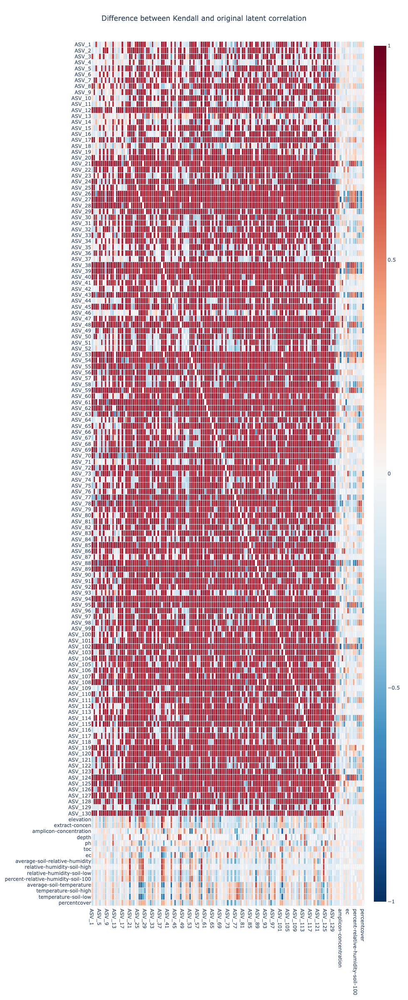

In [ ]:
diff_ken_org = kendall - R_org

diff_fig_org = corr_heatmap(diff_ken_org, title="Difference between Kendall and original latent correlation", show_plot=True)
diff_fig_org.write_image("plots/diff_ken_org.png")

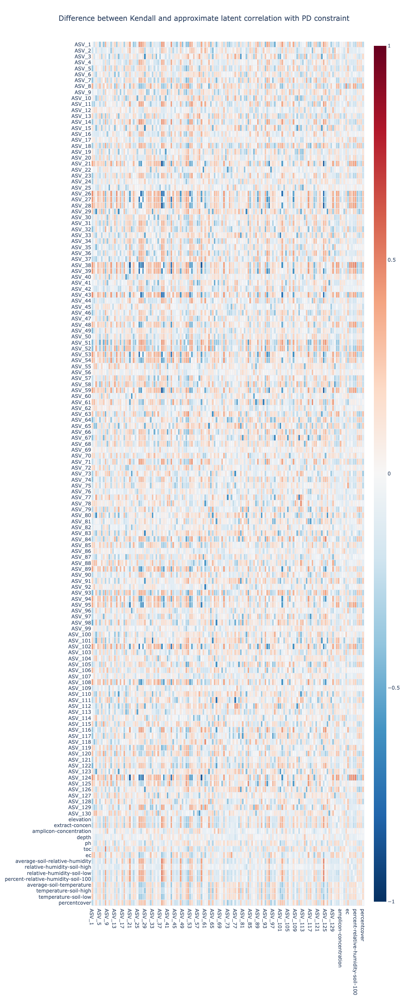

In [ ]:
diff_ken_apx_PD = kendall - R_pdTRUE

diff_fig_apx_PD = corr_heatmap(diff_ken_apx_PD, title="Difference between Kendall and approximate latent correlation with PD constraint", show_plot=True)
diff_fig_apx_PD.write_image("plots/diff_ken_apx_PD.png")

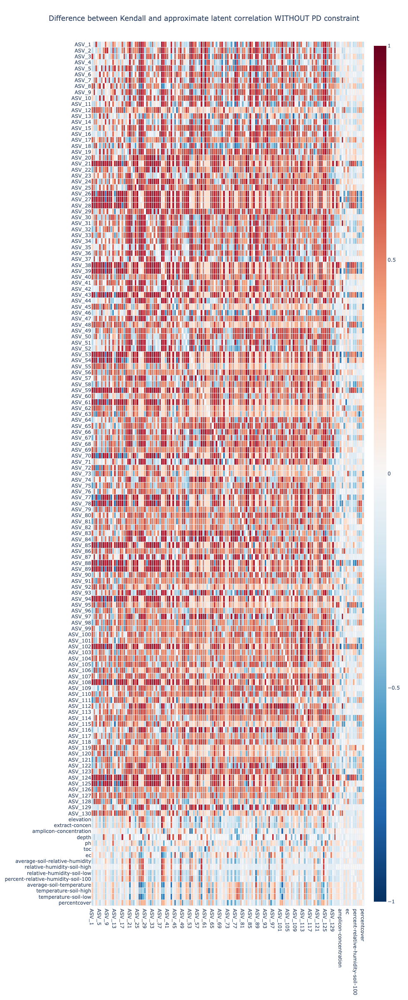

In [ ]:
diff_ken_apx_noPD = kendall - R_pdFALSE

diff_fig_apx_noPD = corr_heatmap(diff_ken_apx_noPD, title="Difference between Kendall and approximate latent correlation WITHOUT PD constraint", show_plot=True)
diff_fig_apx_noPD.write_image("plots/diff_ken_apx_noPD.png")

# Comparison of eigenvalue decomposotion

In [46]:
eig_val_ken = np.linalg.eigvalsh(kendall)
eig_val_R_org = np.linalg.eigvalsh(R_org)
eig_val_R_pdTRUE = np.linalg.eigvalsh(R_pdTRUE)
eig_val_R_pdFALSE = np.linalg.eigvalsh(R_pdFALSE)


print("Kendall eigenvalue range:[{0}; {1}]".format(eig_val_ken.min(), eig_val_ken.max()))
print("Original eigenvalue range:[{0}; {1}]".format(eig_val_R_org.min(), eig_val_R_org.max()))
print("Approximate_PD eigenvalue range:[{0}; {1}]".format(eig_val_R_pdTRUE.min(), eig_val_R_pdTRUE.max()))
print("Approximate_noPD eigenvalue range:[{0}; {1}]".format(eig_val_R_pdFALSE.min(), eig_val_R_pdFALSE.max()))

Kendall eigenvalue range:[-6.722173165546618e-16; 16.06801151673887]
Original eigenvalue range:[-72.8134765625; 42.607425689697266]
Approximate_PD eigenvalue range:[0.0009999999999932337; 35.74313570263851]
Approximate_noPD eigenvalue range:[-46.23112106323242; 42.35647201538086]


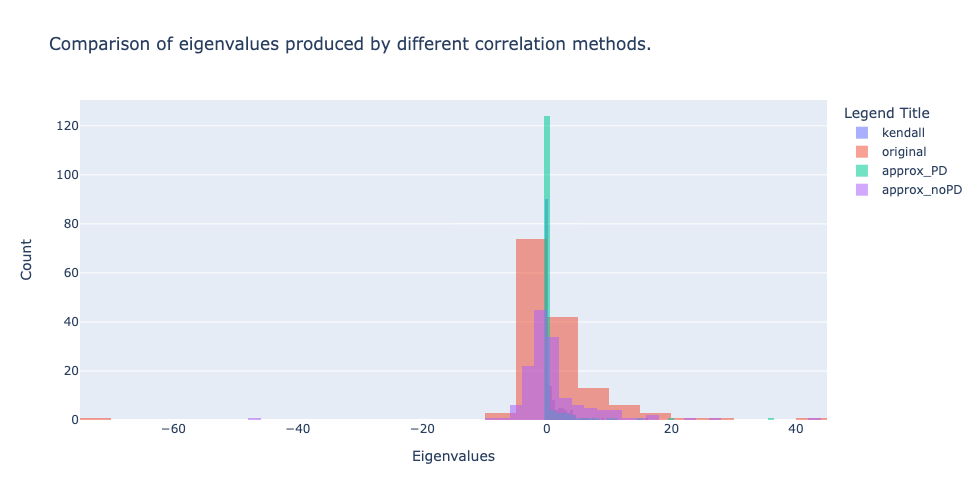

In [45]:
x0 = eig_val_ken
x1 = eig_val_R_org
x2 = eig_val_R_pdTRUE
x3 = eig_val_R_pdFALSE

eigen_fig = go.Figure()
eigen_fig.add_trace(go.Histogram(x=x0, name='kendall', nbinsx=50))
eigen_fig.add_trace(go.Histogram(x=x1, name='original', nbinsx=50))
eigen_fig.add_trace(go.Histogram(x=x2, name='approx_PD', nbinsx=50))
eigen_fig.add_trace(go.Histogram(x=x3, name='approx_noPD', nbinsx=50))

eigen_fig.update_layout(barmode='overlay')
eigen_fig.update_traces(opacity=0.55)

eigen_fig.update_layout(
    title="Comparison of eigenvalues produced by different correlation methods.",
    xaxis_title="Eigenvalues",
    yaxis_title="Count",
    legend_title="Legend Title",
    barmode='overlay',
    width=800,
    height=500
)

eigen_fig.show()
eigen_fig.write_image("plots/eigen_fig.png")